In [4]:
import os

if "COLAB_GPU" in os.environ:
    !pip install -U torch
    !pip install PyMuPDF
    !pip install tqdm
    !pip install sentence-transformers
    !pip install accelerate
    !pip install bitsandbytes
    !pip install flash-attn --no-build-isolation

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.0/20.0 MB 65.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.7/69.7 MB 11.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 38.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for flash-attn: filename=flash_attn-2.7.3-cp311-cp311-linux_x86_64.whl size=191363917 sha256=b1243e9b86687348a5ab03a073abacdf8e3d5e9e4b7e5326a183f47348c5dfba
  Stored in directory: /root/.cache/pip/wheels/d0/a3/f9/48d2706cb2eac05ec0dc144bf6954fe47bb3c2cd0de280765e
Successfully built flash-attn


In [3]:
from google.colab import files
uploaded = files.upload()
print(uploaded)

Saving JavaNotesForProfessionals.pdf to JavaNotesForProfessionals.pdf
{'JavaNotesForProfessionals.pdf': b'%PDF-1.4\r\n%\xe2\xe3\xcf\xd3\r\n9303 0 obj\r\n<<\r\n/Linearized 1\r\n/L 7386481\r\n/H [ 23038 14910 ]\r\n/O 9305\r\n/E 265148\r\n/N 982\r\n/T 7200292\r\n>>\r\nendobj\r\n                                            \r\nxref\r\n9303 1120\r\n0000000017 00000 n\r\n0000022878 00000 n\r\n0000037948 00000 n\r\n0000038367 00000 n\r\n0000038528 00000 n\r\n0000039520 00000 n\r\n0000039599 00000 n\r\n0000039895 00000 n\r\n0000051184 00000 n\r\n0000051613 00000 n\r\n0000051915 00000 n\r\n0000052081 00000 n\r\n0000053093 00000 n\r\n0000053403 00000 n\r\n0000064052 00000 n\r\n0000064452 00000 n\r\n0000064622 00000 n\r\n0000065683 00000 n\r\n0000065991 00000 n\r\n0000078241 00000 n\r\n0000078663 00000 n\r\n0000078830 00000 n\r\n0000079871 00000 n\r\n0000080182 00000 n\r\n0000092387 00000 n\r\n0000092803 00000 n\r\n0000092876 00000 n\r\n0000104238 00000 n\r\n0000214743 00000 n\r\n0000264752 00000 

In [5]:
import fitz
from tqdm import tqdm

def text_formatter(text: str) -> str:
    clean = text.replace("\n", " ").strip()
    return clean

def open_and_read_pdf(uploaded: dict) -> list[dict]:
    #  uploaded dictionary se filename extract kr rha
    filename = list(uploaded.keys())[0]
    # Opens the PDF using the filename
    doc = fitz.open(stream=uploaded[filename], filename=filename)
    pages_and_texts = []
    for page_number, page in tqdm(enumerate(doc)):
        text = page.get_text()
        text = text_formatter(text)
        pages_and_texts.append({"page_number": page_number - 25,
                                "page_char_count": len(text),
                                "page_word_count": len(text.split(" ")),
                                "page_sentence_count_raw": len(text.split(". ")),
                                "page_token_count": len(text) / 4,
                                "page text": text})

    return pages_and_texts
pages_and_texts = open_and_read_pdf(uploaded=uploaded)
pages_and_texts[:2]

982it [00:03, 303.68it/s]


[{'page_number': -25,
  'page_char_count': 362,
  'page_word_count': 53,
  'page_sentence_count_raw': 2,
  'page_token_count': 90.5,
  'page text': 'Java Notes for Professionals Java ® Notes for Professionals GoalKicker.com Free Programming Books Disclaimer This is an uno\ue024cial free book created for educational purposes and is not a\ue024liated with o\ue024cial Java® group(s) or company(s). All trademarks and registered trademarks are the property of their respective owners 900+ pages of professional hints and tricks'},
 {'page_number': -24,
  'page_char_count': 7345,
  'page_word_count': 502,
  'page_sentence_count_raw': 46,
  'page_token_count': 1836.25,
  'page text': 'Contents About  1  ...................................................................................................................................................................................  Chapter 1: Getting started with Java Language  2  .................................................................

In [6]:
import random

random.sample(pages_and_texts, k=3)

[{'page_number': 10,
  'page_char_count': 1158,
  'page_word_count': 220,
  'page_sentence_count_raw': 5,
  'page_token_count': 289.5,
  'page text': 'GoalKicker.com – Java® Notes for Professionals 12   private String  name;   private int age;   public int getAge() {     return age;   }   public void setAge(int age) {     this.age = age;   }   public String getName() {     return name;   }   public void setName(String name) {     this.name = name;   } } These private variables cannot be accessed directly from outside the class. Hence they are protected from unauthorized access. But if you want to view or modify them, you can use Getters and Setters. getXxx() method will return the current value of the variable xxx, while you can set the value of the variable xxx using setXxx(). The naming convention of the methods are (in example variable is called variableName): All non boolean variables  getVariableName()   //Getter, The variable name should start with uppercase  setVariableName(..) 

In [7]:
import pandas as pd

In [8]:
df = pd.DataFrame(pages_and_texts)
df.head()

,page_number,page_char_count,page_word_count,page_sentence_count_raw,page_token_count,page text
0,-25,362,53,2,90.50,Java Notes for Professionals Java ® Notes for ...
1,-24,7345,502,46,1836.25,Contents About 1 ..............................
2,-23,7882,549,50,1970.50,Section 9.7: Character literals 38 ............
3,-22,7808,532,50,1952.00,Section 16.4: Creating a Speciﬁc Date 75 ......
4,-21,7971,577,50,1992.75,Section 23.6: Array Covariance 120 ............


In [9]:
 df.head(100)

,page_number,page_char_count,page_word_count,page_sentence_count_raw,page_token_count,page text
0,-25,362,53,2,90.50,Java Notes for Professionals Java ® Notes for ...
1,-24,7345,502,46,1836.25,Contents About 1 ..............................
2,-23,7882,549,50,1970.50,Section 9.7: Character literals 38 ............
3,-22,7808,532,50,1952.00,Section 16.4: Creating a Speciﬁc Date 75 ......
4,-21,7971,577,50,1992.75,Section 23.6: Array Covariance 120 ............
...,...,...,...,...,...,...
95,70,788,136,4,197.00,GoalKicker.com – Java® Notes for Professionals...
96,71,1880,340,3,470.00,GoalKicker.com – Java® Notes for Professionals...
97,72,1713,225,3,428.25,GoalKicker.com – Java® Notes for Professionals...
98,73,2179,330,15,544.75,GoalKicker.com – Java® Notes for Professionals...


In [10]:

df.describe().round(2)

,page_number,page_char_count,page_word_count,page_sentence_count_raw,page_token_count
count,982.00,982.00,982.00,982.00,982.00
mean,465.50,1944.66,359.65,10.15,486.16
std,283.62,1064.10,156.41,9.09,266.02
min,-25.00,17.00,4.00,1.00,4.25
25%,220.25,1508.25,271.00,4.00,377.06
50%,465.50,1894.00,360.00,8.00,473.50
75%,710.75,2269.00,445.75,14.00,567.25
max,956.00,7991.00,1270.00,52.00,1997.75


In [11]:
from spacy.lang.en import English

nlp = English()


nlp.add_pipe("sentencizer")


doc = nlp("This is a sentence. This another sentence.")
assert len(list(doc.sents)) == 2


list(doc.sents)

[This is a sentence., This another sentence.]

In [12]:
for item in tqdm(pages_and_texts):

    item["sentences"] = list(nlp(item["page text"]).sents)


    item["sentences"] = [str(sentence) for sentence in item["sentences"]]


    item["page_sentence_count_spacy"] = len(item["sentences"])

100%|██████████| 982/982 [00:02<00:00, 391.47it/s]


In [13]:
random.sample(pages_and_texts, k=1)

[{'page_number': 164,
  'page_char_count': 1721,
  'page_word_count': 283,
  'page_sentence_count_raw': 9,
  'page_token_count': 430.25,
  'page text': 'GoalKicker.com – Java® Notes for Professionals 166   map.forEach((key, value) -> System.out.println("Key: "+key+ " :: Value: "+value));    // Key: 1 :: Value: one    // Key: 2 :: Value: two    // Key: 3 :: Value: three Using replaceAll 3. Will replace with new-value only if key is present  Map<String, Integer> map = new HashMap<String, Integer>();  map.put("john", 20);  map.put("paul", 30);  map.put("peter", 40);  map.replaceAll((key,value)->value+10);   //{john=30, paul=40, peter=50} Using putIfAbsent 4. Key-Value pair is added to the map, if the key is not present or mapped to null     Map<String, Integer> map = new HashMap<String, Integer>();     map.put("john", 20);     map.put("paul", 30);     map.put("peter", 40);     map.putIfAbsent("kelly", 50);     //{john=20, paul=30, peter=40, kelly=50} Using remove 5. Removes the key only i

In [14]:
df = pd.DataFrame(pages_and_texts)
df.describe().round(2)

,page_number,page_char_count,page_word_count,page_sentence_count_raw,page_token_count,page_sentence_count_spacy
count,982.00,982.00,982.00,982.00,982.00,982.00
mean,465.50,1944.66,359.65,10.15,486.16,10.86
std,283.62,1064.10,156.41,9.09,266.02,7.28
min,-25.00,17.00,4.00,1.00,4.25,1.00
25%,220.25,1508.25,271.00,4.00,377.06,5.00
50%,465.50,1894.00,360.00,8.00,473.50,10.00
75%,710.75,2269.00,445.75,14.00,567.25,15.00
max,956.00,7991.00,1270.00,52.00,1997.75,48.00


In [15]:
chunk_size = 10
def split_list(input_list: list, chunk_size: int) -> list:
    return [input_list[i:i+chunk_size] for i in range(0, len(input_list), chunk_size)]


In [16]:
for item in tqdm(pages_and_texts):
    item["sentences_chunks"] = split_list(item["sentences"], chunk_size=chunk_size)

100%|██████████| 982/982 [00:00<00:00, 317588.60it/s]


In [17]:
random.sample(pages_and_texts,k=2)

[{'page_number': 391,
  'page_char_count': 1014,
  'page_word_count': 218,
  'page_sentence_count_raw': 1,
  'page_token_count': 253.5,
  'page text': 'GoalKicker.com – Java® Notes for Professionals 393 Linda Mary Here is the entire program, with both additions: public class Person {   private String name;   public void setName(String name) { this.name = name; }   public String getName() { return name; }   public static void main(String [] arguments) {     Person person = new Person();     person.setName("Bob");     int i = 5;     setPersonName(person, i);     System.out.println(person.getName() + " " + i);         getAnotherObjectNot(person);     System.out.println(person.getName());         Person person;     person = getAnotherObject();     System.out.println(person.getName());   }     private static void setPersonName(Person person, int num) {     person.setName("Linda");     num = 99;   }     private static void getAnotherObjectNot(Person person) {     person = new Person();     p

In [18]:

df = pd.DataFrame(pages_and_texts)
df.describe().round(2)

,page_number,page_char_count,page_word_count,page_sentence_count_raw,page_token_count,page_sentence_count_spacy
count,982.00,982.00,982.00,982.00,982.00,982.00
mean,465.50,1944.66,359.65,10.15,486.16,10.86
std,283.62,1064.10,156.41,9.09,266.02,7.28
min,-25.00,17.00,4.00,1.00,4.25,1.00
25%,220.25,1508.25,271.00,4.00,377.06,5.00
50%,465.50,1894.00,360.00,8.00,473.50,10.00
75%,710.75,2269.00,445.75,14.00,567.25,15.00
max,956.00,7991.00,1270.00,52.00,1997.75,48.00


In [19]:
import re


pages_and_chunks = []
for item in tqdm(pages_and_texts):
    for sentence_chunk in item["sentences_chunks"]:
        chunk_dict = {}
        chunk_dict["page_number"] = item["page_number"]


        joined_sentence_chunk = "".join(sentence_chunk).replace("  ", " ").strip()
        joined_sentence_chunk = re.sub(r'\.([A-Z])', r'. \1', joined_sentence_chunk)
        chunk_dict["sentence_chunk"] = joined_sentence_chunk


        chunk_dict["chunk_char_count"] = len(joined_sentence_chunk)
        chunk_dict["chunk_word_count"] = len([word for word in joined_sentence_chunk.split(" ")])
        chunk_dict["chunk_token_count"] = len(joined_sentence_chunk) / 4

        pages_and_chunks.append(chunk_dict)


len(pages_and_chunks)

100%|██████████| 982/982 [00:00<00:00, 18327.07it/s]


1553

In [20]:

random.sample(pages_and_chunks, k=1)

[{'page_number': 210,
  'sentence_chunk': 'GoalKicker.com – Java® Notes for Professionals 212 The & operator is used for "masking out" some of the bits in an integer operand. For example: int word = 0b00101010; int mask = 0b00000011;  // Mask for masking out all but the bottom             // two bits of a word int lowBits = word & mask;      // -> 0b00000010 int highBits = word & ~mask;     // -> 0b00101000 The | operator is used to combine the truth values of two operands. For example: int word2 = 0b01011111; // Combine the bottom 2 bits of word1 with the top 30 bits of word2 int combined = (word & mask) | (word2 & ~mask);  // -> 0b01011110 The ^ operator is used for toggling or "ﬂipping" bits: int word3 = 0b00101010; int word4 = word3 ^ mask;       // -> 0b00101001 For more examples of the use of the bitwise operators, see Bit Manipulation Section 40.4: The String Concatenation Operator (+) The + symbol can mean three distinct operators in Java: If there is no operand before the +, t

In [23]:

df = pd.DataFrame(pages_and_chunks)
df.describe().round(2)

,page_number,chunk_char_count,chunk_word_count,chunk_token_count
count,1553.00,1553.00,1553.00,1553.00
mean,476.60,1194.45,192.58,298.61
std,285.54,950.55,111.84,237.64
min,-25.00,9.00,1.00,2.25
25%,225.00,653.00,107.00,163.25
50%,486.00,1128.00,187.00,282.00
75%,726.00,1545.00,267.00,386.25
max,956.00,7844.00,776.00,1961.00


In [24]:

min_token_length = 30
for row in df[df["chunk_token_count"] <= min_token_length].sample(5).iterrows():
    print(f'Chunk token count: {row[1]["chunk_token_count"]} | Text: {row[1]["sentence_chunk"]}')

Chunk token count: 5.5 | Text: That is a memory leak.
Chunk token count: 26.25 | Text: better to use a logging framework, and pass the exception object to be logged. Understanding a stacktrace
Chunk token count: 28.0 | Text: Base class deﬁnes structure of the algorithm (Template method) and sub-class will override a part of 4.algorithm
Chunk token count: 14.25 | Text: public class StrictFP { // No strictfp -> default lenient
Chunk token count: 10.5 | Text: LocalDate has 5 methods to compare dates :


In [25]:
pages_and_chunks_over_min_token_len = df[df["chunk_token_count"] > min_token_length].to_dict(orient="records")
pages_and_chunks_over_min_token_len[:2]

[{'page_number': -25,
  'sentence_chunk': 'Java Notes for Professionals Java ® Notes for Professionals GoalKicker.com Free Programming Books Disclaimer This is an uno\ue024cial free book created for educational purposes and is not a\ue024liated with o\ue024cial Java® group(s) or company(s). All trademarks and registered trademarks are the property of their respective owners 900+ pages of professional hints and tricks',
  'chunk_char_count': 362,
  'chunk_word_count': 53,
  'chunk_token_count': 90.5},
 {'page_number': -24,
  'sentence_chunk': 'Contents About 1 ................................................................................................................................................................................... Chapter 1: Getting started with Java Language 2 .......................................................................................... Section 1.1: Creating Your First Java Program 2 ...................................................................

In [31]:

from sentence_transformers import SentenceTransformer
embedding_model = SentenceTransformer(model_name_or_path="all-mpnet-base-v2",
                                      device="cuda")


sentences = [
    "The Sentences Transformers library provides an easy and open-source way to create embeddings.",
    "Sentences can be embedded one by one or as a list of strings.",
    "Embeddings are one of the most powerful concepts in machine learning!",
    "Learn to use embeddings well and you'll be well on your way to being an AI engineer."
]


embeddings = embedding_model.encode(sentences)
embeddings_dict = dict(zip(sentences, embeddings))


for sentence, embedding in embeddings_dict.items():
    print("Sentence:", sentence)
    print("Embedding:", embedding)
    print("")

Sentence: The Sentences Transformers library provides an easy and open-source way to create embeddings.
Embedding: [-2.07981113e-02  3.03164795e-02 -2.01218147e-02  6.86483756e-02
 -2.55255271e-02 -8.47689621e-03 -2.07084100e-04 -6.32377341e-02
  2.81606186e-02 -3.33352946e-02  3.02635301e-02  5.30720539e-02
 -5.03526032e-02  2.62288153e-02  3.33314314e-02 -4.51578870e-02
  3.63044329e-02 -1.37113058e-03 -1.20171346e-02  1.14946300e-02
  5.04510924e-02  4.70857024e-02  2.11912952e-02  5.14607318e-02
 -2.03746632e-02 -3.58889513e-02 -6.67892222e-04 -2.94393133e-02
  4.95858938e-02 -1.05639584e-02 -1.52014289e-02 -1.31752621e-03
  4.48197350e-02  1.56022953e-02  8.60380283e-07 -1.21392391e-03
 -2.37978548e-02 -9.09427938e-04  7.34480796e-03 -2.53931968e-03
  5.23369759e-02 -4.68043573e-02  1.66214537e-02  4.71578874e-02
 -4.15599234e-02  9.01929627e-04  3.60278897e-02  3.42214443e-02
  9.68227461e-02  5.94828576e-02 -1.64984558e-02 -3.51249650e-02
  5.92514267e-03 -7.08006672e-04 -2.4103

In [42]:
single_sentence = "Yo! How cool are embeddings?"
single_embedding = embedding_model.encode(single_sentence)
print(f"Sentence: {single_sentence}")
print(f"Embedding:\n{single_embedding}")
print(f"Embedding size: {single_embedding.shape}")

Sentence: Yo! How cool are embeddings?
Embedding:
[-1.97447464e-02 -4.51087253e-03 -4.98483423e-03  6.55444637e-02
 -9.87672526e-03  2.72835493e-02  3.66425887e-02 -3.30221560e-03
  8.50079302e-03  8.24952498e-03 -2.28497107e-02  4.02430221e-02
 -5.75200096e-02  6.33692443e-02  4.43207808e-02 -4.49507460e-02
  1.25284223e-02 -2.52012070e-02 -3.55292521e-02  1.29558714e-02
  8.67023412e-03 -1.92917697e-02  3.55632859e-03  1.89506132e-02
 -1.47128226e-02 -9.39843804e-03  7.64168892e-03  9.62190144e-03
 -5.98927913e-03 -3.90169360e-02 -5.47824726e-02 -5.67456894e-03
  1.11645199e-02  4.08067591e-02  1.76319077e-06  9.15297028e-03
 -8.77261441e-03  2.39382703e-02 -2.32784320e-02  8.04999545e-02
  3.19176726e-02  5.12595009e-03 -1.47708422e-02 -1.62524804e-02
 -6.03213236e-02 -4.35689576e-02  4.51211669e-02 -1.79053992e-02
  2.63367146e-02 -3.47867012e-02 -8.89172684e-03 -5.47674969e-02
 -1.24372719e-02 -2.38606632e-02  8.33496824e-02  5.71242534e-02
  1.13328667e-02 -1.49594946e-02  9.2037

In [38]:
%%time


embedding_model.to("cuda")


for item in tqdm(pages_and_chunks_over_min_token_len):
    item["embedding"] = embedding_model.encode(item["sentence_chunk"])

100%|██████████| 1495/1495 [00:39<00:00, 38.23it/s]

CPU times: user 37.3 s, sys: 239 ms, total: 37.6 s
Wall time: 39.1 s


In [43]:

text_chunks = [item["sentence_chunk"] for item in pages_and_chunks_over_min_token_len]

In [40]:
%%time


text_chunk_embeddings = embedding_model.encode(text_chunks,
                                               batch_size=32,
                                               convert_to_tensor=True)

text_chunk_embeddings

CPU times: user 34.6 s, sys: 267 ms, total: 34.8 s
Wall time: 34 s


tensor([[ 0.0355, -0.0735, -0.0237,  ...,  0.0096,  0.0903, -0.0309],
        [ 0.0259, -0.1015, -0.0458,  ..., -0.0087,  0.0349, -0.0238],
        [-0.0506, -0.0763, -0.0331,  ...,  0.0014, -0.0012, -0.0504],
        ...,
        [ 0.0180, -0.0304, -0.0242,  ...,  0.0667, -0.0161, -0.0367],
        [ 0.0477,  0.0344, -0.0328,  ...,  0.0403, -0.0083, -0.0485],
        [ 0.0104, -0.0380, -0.0220,  ...,  0.0654,  0.0198, -0.0422]],
       device='cuda:0')

In [44]:

text_chunks_and_embeddings_df = pd.DataFrame(pages_and_chunks_over_min_token_len)
embeddings_df_save_path = "text_chunks_and_embeddings_df.csv"
text_chunks_and_embeddings_df.to_csv(embeddings_df_save_path, index=False)

In [46]:

text_chunks_and_embedding_df_load = pd.read_csv(embeddings_df_save_path)
text_chunks_and_embedding_df_load.head()

,page_number,sentence_chunk,chunk_char_count,chunk_word_count,chunk_token_count,embedding
0,-25,Java Notes for Professionals Java ® Notes for ...,362,53,90.5,[ 3.54716666e-02 -7.34969825e-02 -2.36593261e-...
1,-24,Contents About 1 ................................,7208,365,1802.0,[ 2.59291213e-02 -1.01549841e-01 -4.57718819e-...
2,-23,Section 9.7: Character literals 38 ..............,7738,405,1934.5,[-5.05959280e-02 -7.63338357e-02 -3.31083871e-...
3,-22,Section 16.4: Creating a Speciﬁc Date 75 ........,7664,388,1916.0,[ 2.40504555e-02 -5.58101339e-03 -5.68589801e-...
4,-21,Section 23.6: Array Covariance 120 ..............,7822,428,1955.5,[-1.35512203e-02 -6.40501678e-02 -4.70960401e-...


In [48]:
import random

import torch
import numpy as np
import pandas as pd

device = "cuda"


text_chunks_and_embedding_df = pd.read_csv("text_chunks_and_embeddings_df.csv")


text_chunks_and_embedding_df["embedding"] = text_chunks_and_embedding_df["embedding"].apply(lambda x: np.fromstring(x.strip("[]"), sep=" "))


pages_and_chunks = text_chunks_and_embedding_df.to_dict(orient="records")


embeddings = torch.tensor(np.array(text_chunks_and_embedding_df["embedding"].tolist()), dtype=torch.float32).to(device)
embeddings.shape

torch.Size([1495, 768])

In [49]:
text_chunks_and_embedding_df.head()

,page_number,sentence_chunk,chunk_char_count,chunk_word_count,chunk_token_count,embedding
0,-25,Java Notes for Professionals Java ® Notes for ...,362,53,90.5,"[0.0354716666, -0.0734969825, -0.0236593261, 0..."
1,-24,Contents About 1 ................................,7208,365,1802.0,"[0.0259291213, -0.101549841, -0.0457718819, 0...."
2,-23,Section 9.7: Character literals 38 ..............,7738,405,1934.5,"[-0.050595928, -0.0763338357, -0.0331083871, 0..."
3,-22,Section 16.4: Creating a Speciﬁc Date 75 ........,7664,388,1916.0,"[0.0240504555, -0.00558101339, -0.00568589801,..."
4,-21,Section 23.6: Array Covariance 120 ..............,7822,428,1955.5,"[-0.0135512203, -0.0640501678, -0.0470960401, ..."


In [50]:
embeddings[0]

tensor([ 3.5472e-02, -7.3497e-02, -2.3659e-02,  9.0833e-03, -1.9510e-02,
        -6.1165e-02, -1.5174e-02, -1.5155e-02, -2.2614e-02, -2.7298e-03,
         5.5170e-02,  4.2330e-02,  4.3457e-02,  4.2138e-02, -1.4698e-02,
        -8.9218e-02,  3.3761e-02, -2.3099e-02,  1.0036e-02,  9.8175e-03,
        -1.2630e-02, -5.3339e-03,  1.9840e-03,  4.2620e-02, -9.4289e-03,
        -5.4682e-02, -4.9821e-02, -1.5845e-02, -2.0657e-02, -3.0950e-02,
        -2.3757e-02,  1.1987e-02, -2.0425e-02, -7.6291e-03,  2.2902e-06,
        -2.2774e-02,  1.4534e-02,  2.0614e-02, -1.7563e-04,  1.2068e-01,
        -3.6040e-03,  6.0684e-02, -1.5174e-02,  8.4448e-03,  2.5080e-02,
         1.1659e-02,  5.2727e-02, -2.6020e-02,  6.7073e-02, -1.7939e-03,
         1.1420e-02, -5.2640e-03, -1.2246e-02,  9.3655e-03,  2.0857e-02,
        -7.2278e-02,  5.2408e-02,  4.0906e-02,  4.3261e-02,  1.7253e-02,
        -5.6522e-02, -7.7780e-02, -2.2351e-02, -1.7214e-02,  6.2336e-02,
        -1.4943e-02, -1.0438e-02,  1.0756e-02,  3.5

In [51]:
from sentence_transformers import util, SentenceTransformer

embedding_model = SentenceTransformer(model_name_or_path="all-mpnet-base-v2",
                                      device=device)

In [52]:

query = "what happens in switch case without break"
print(f"Query: {query}")


query_embedding = embedding_model.encode(query, convert_to_tensor=True)


from time import perf_counter as timer

start_time = timer()
dot_scores = util.dot_score(a=query_embedding, b=embeddings)[0]
end_time = timer()

print(f"Time take to get scores on {len(embeddings)} embeddings: {end_time-start_time:.5f} seconds.")


top_results_dot_product = torch.topk(dot_scores, k=5)
top_results_dot_product

Query: what happens in switch case without break
Time take to get scores on 1495 embeddings: 0.02115 seconds.


torch.return_types.topk(
values=tensor([0.5478, 0.5348, 0.4597, 0.4563, 0.4470], device='cuda:0'),
indices=tensor([ 681, 1121,  691,   11,  119], device='cuda:0'))

In [53]:
larger_embeddings = torch.randn(100*embeddings.shape[0], 768).to(device)
print(f"Embeddings shape: {larger_embeddings.shape}")

# Perform dot product across 168,000 embeddings
start_time = timer()
dot_scores = util.dot_score(a=query_embedding, b=larger_embeddings)[0]
end_time = timer()

print(f"Time take to get scores on {len(larger_embeddings)} embeddings: {end_time-start_time:.5f} seconds.")

Embeddings shape: torch.Size([149500, 768])
Time take to get scores on 149500 embeddings: 0.00114 seconds.


In [55]:
import textwrap
import random
import torch
import numpy as np
import pandas as pd



def print_wrapped(text):
    """Wraps and prints text for better readability."""
    print(textwrap.fill(text, width=80))

print(f"Query: '{query}'\n")
print("Results:")

for score, idx in zip(top_results_dot_product[0], top_results_dot_product[1]):
    print(f"Score: {score:.4f}")

    print("Text:")
    print_wrapped(pages_and_chunks[idx]["sentence_chunk"])
    # Print the page number too so we can reference the textbook further (and check the results)
    print(f"Page number: {pages_and_chunks[idx]['page_number']}")
    print("\n")

Query: 'what happens in switch case without break'

Results:
Score: 0.5478
Text:
GoalKicker.com – Java® Notes for Professionals 438 Chapter 74: Basic Control
Structures Section 74.1: Switch statement The switch statement is Java's multi-
way branch statement. It is used to take the place of long if-else if-else
chains, and make them more readable. However, unlike if statements, one may not
use inequalities; each value must be concretely deﬁned. There are three critical
components to the switch statement: case: This is the value that is evaluated
for equivalence with the argument to the switch statement.default: This is an
optional, catch-all expression, should none of the case statements evaluate to
true. Abrupt completion of the case statement; usually break: This is required
to prevent the undesired evaluation of further case statements. With the
exception of continue, it is possible to use any statement which would cause the
abrupt completion of a statement. This includes: break ret

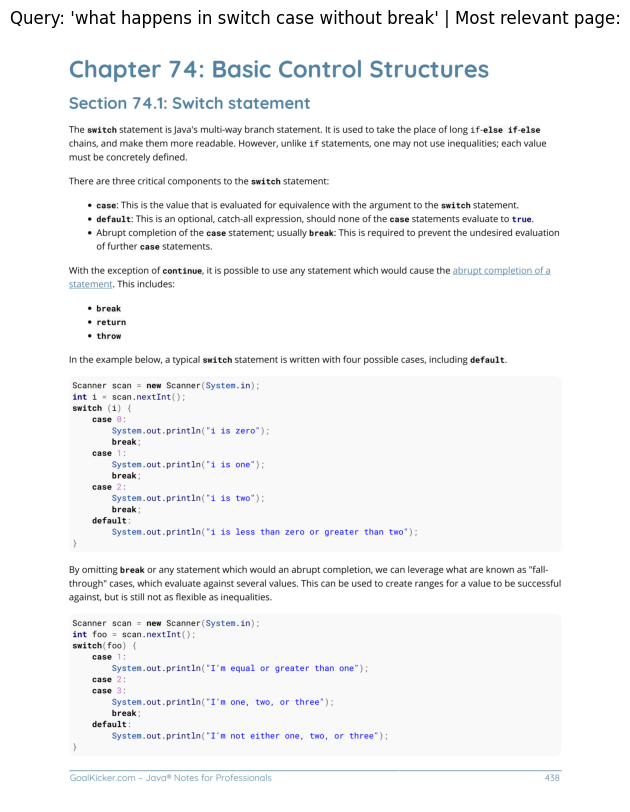

In [59]:
import fitz



filename = list(uploaded.keys())[0]
file_content = uploaded[filename]


doc = fitz.open(stream=file_content, filename=filename)
page = doc.load_page(436 + 25)


img = page.get_pixmap(dpi=300)


doc.close()


img_array = np.frombuffer(img.samples_mv,
                          dtype=np.uint8).reshape((img.h, img.w, img.n))


import matplotlib.pyplot as plt
plt.figure(figsize=(13, 10))
plt.imshow(img_array)
plt.title(f"Query: '{query}' | Most relevant page:")
plt.axis('off')
plt.show()

In [61]:
import torch

def dot_product(vector1, vector2):
    return torch.dot(vector1, vector2)

def cosine_similarity(vector1, vector2):
    dot_product = torch.dot(vector1, vector2)


    norm_vector1 = torch.sqrt(torch.sum(vector1**2))
    norm_vector2 = torch.sqrt(torch.sum(vector2**2))

    return dot_product / (norm_vector1 * norm_vector2)


vector1 = torch.tensor([1, 2, 3], dtype=torch.float32)
vector2 = torch.tensor([1, 2, 3], dtype=torch.float32)
vector3 = torch.tensor([4, 5, 6], dtype=torch.float32)
vector4 = torch.tensor([-1, -2, -3], dtype=torch.float32)


print("Dot product between vector1 and vector2:", dot_product(vector1, vector2))
print("Dot product between vector1 and vector3:", dot_product(vector1, vector3))
print("Dot product between vector1 and vector4:", dot_product(vector1, vector4))


print("Cosine similarity between vector1 and vector2:", cosine_similarity(vector1, vector2))
print("Cosine similarity between vector1 and vector3:", cosine_similarity(vector1, vector3))
print("Cosine similarity between vector1 and vector4:", cosine_similarity(vector1, vector4))

Dot product between vector1 and vector2: tensor(14.)
Dot product between vector1 and vector3: tensor(32.)
Dot product between vector1 and vector4: tensor(-14.)
Cosine similarity between vector1 and vector2: tensor(1.0000)
Cosine similarity between vector1 and vector3: tensor(0.9746)
Cosine similarity between vector1 and vector4: tensor(-1.0000)


In [62]:
def retrieve_relevant_resources(query: str,
                                embeddings: torch.tensor,
                                model: SentenceTransformer=embedding_model,
                                n_resources_to_return: int=5,
                                print_time: bool=True):
    """
    Embeds a query with model and returns top k scores and indices from embeddings.
    """


    query_embedding = model.encode(query,
                                   convert_to_tensor=True)


    start_time = timer()
    dot_scores = util.dot_score(query_embedding, embeddings)[0]
    end_time = timer()

    if print_time:
        print(f"[INFO] Time taken to get scores on {len(embeddings)} embeddings: {end_time-start_time:.5f} seconds.")

    scores, indices = torch.topk(input=dot_scores,
                                 k=n_resources_to_return)

    return scores, indices

def print_top_results_and_scores(query: str,
                                 embeddings: torch.tensor,
                                 pages_and_chunks: list[dict]=pages_and_chunks,
                                 n_resources_to_return: int=5):
    """
    Takes a query, retrieves most relevant resources and prints them out in descending order.

    Note: Requires pages_and_chunks to be formatted in a specific way (see above for reference).
    """

    scores, indices = retrieve_relevant_resources(query=query,
                                                  embeddings=embeddings,
                                                  n_resources_to_return=n_resources_to_return)

    print(f"Query: {query}\n")
    print("Results:")

    for score, index in zip(scores, indices):
        print(f"Score: {score:.4f}")

        print_wrapped(pages_and_chunks[index]["sentence_chunk"])

        print(f"Page number: {pages_and_chunks[index]['page_number']}")
        print("\n")

In [63]:
query = "what are duplicate entry sets ?"


scores, indices = retrieve_relevant_resources(query=query,
                                              embeddings=embeddings)
scores, indices

[INFO] Time taken to get scores on 1495 embeddings: 0.00009 seconds.


(tensor([0.5148, 0.4684, 0.4487, 0.4334, 0.4117], device='cuda:0'),
 tensor([268, 561, 270, 273, 269], device='cuda:0'))

In [64]:

print_top_results_and_scores(query=query,
                             embeddings=embeddings)

[INFO] Time taken to get scores on 1495 embeddings: 0.00009 seconds.
Query: what are duplicate entry sets ?

Results:
Score: 0.5148
GoalKicker.com – Java® Notes for Professionals 157 Chapter 26: Sets Section
26.1: Initialization A Set is a Collection that cannot contain duplicate
elements. It models the mathematical set abstraction. Set have its
implementation in various classes like HashSet, TreeSet, LinkedHashSet. For
example: HashSet: Set<T> set = new HashSet<T>(); Here T can be String, Integer
or any other object. HashSet allows for quick lookup of O(1) but does not sort
the data added to it and loses the insertion order of items. TreeSet: It stores
data in a sorted manner sacriﬁcing some speed for basic operations which take
O(lg(n)). It does not maintain the insertion order of items. TreeSet<T>
sortedSet = new TreeSet<T>(); LinkedHashSet: It is a linked list implementation
of HashSet Once can iterate over the items in the order they were added. Sorting
is not provided for its con

In [65]:

    use_quantization_config = False
    model_id = "google/gemma-2b-it"


print(f"use_quantization_config set to: {use_quantization_config}")
print(f"model_id set to: {model_id}")

use_quantization_config set to: False
model_id set to: google/gemma-2b-it


In [71]:
!pip install huggingface_hub
from huggingface_hub import notebook_login

notebook_login()

In [72]:
import torch
from transformers import AutoTokenizer, AutoModelForCausalLM
from transformers.utils import is_flash_attn_2_available


from transformers import BitsAndBytesConfig
quantization_config = BitsAndBytesConfig(load_in_4bit=True,
                                         bnb_4bit_compute_dtype=torch.float16)


if (is_flash_attn_2_available()) and (torch.cuda.get_device_capability(0)[0] >= 8):
  attn_implementation = "flash_attention_2"
else:
  attn_implementation = "sdpa"
print(f"[INFO] Using attention implementation: {attn_implementation}")


model_id = model_id
print(f"[INFO] Using model_id: {model_id}")


tokenizer = AutoTokenizer.from_pretrained(pretrained_model_name_or_path=model_id)


llm_model = AutoModelForCausalLM.from_pretrained(pretrained_model_name_or_path=model_id,
                                                 torch_dtype=torch.float16,
                                                 quantization_config=quantization_config if use_quantization_config else None,
                                                 low_cpu_mem_usage=False,
                                                 attn_implementation=attn_implementation)

if not use_quantization_config:
    llm_model.to("cuda")

[INFO] Using attention implementation: sdpa
[INFO] Using model_id: google/gemma-2b-it


tokenizer_config.json:   0%|          | 0.00/34.2k [00:00<?, ?B/s]

tokenizer.model:   0%|          | 0.00/4.24M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/17.5M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/636 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/627 [00:00<?, ?B/s]

model.safetensors.index.json:   0%|          | 0.00/13.5k [00:00<?, ?B/s]

model-00001-of-00002.safetensors:   0%|          | 0.00/4.95G [00:00<?, ?B/s]

model-00002-of-00002.safetensors:   0%|          | 0.00/67.1M [00:00<?, ?B/s]

`config.hidden_act` is ignored, you should use `config.hidden_activation` instead.
Gemma's activation function will be set to `gelu_pytorch_tanh`. Please, use
`config.hidden_activation` if you want to override this behaviour.
See https://github.com/huggingface/transformers/pull/29402 for more details.


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/137 [00:00<?, ?B/s]

In [73]:
llm_model

GemmaForCausalLM(
  (model): GemmaModel(
    (embed_tokens): Embedding(256000, 2048, padding_idx=0)
    (layers): ModuleList(
      (0-17): 18 x GemmaDecoderLayer(
        (self_attn): GemmaSdpaAttention(
          (q_proj): Linear(in_features=2048, out_features=2048, bias=False)
          (k_proj): Linear(in_features=2048, out_features=256, bias=False)
          (v_proj): Linear(in_features=2048, out_features=256, bias=False)
          (o_proj): Linear(in_features=2048, out_features=2048, bias=False)
          (rotary_emb): GemmaRotaryEmbedding()
        )
        (mlp): GemmaMLP(
          (gate_proj): Linear(in_features=2048, out_features=16384, bias=False)
          (up_proj): Linear(in_features=2048, out_features=16384, bias=False)
          (down_proj): Linear(in_features=16384, out_features=2048, bias=False)
          (act_fn): PytorchGELUTanh()
        )
        (input_layernorm): GemmaRMSNorm((2048,), eps=1e-06)
        (post_attention_layernorm): GemmaRMSNorm((2048,), eps=1e-

In [74]:
input_text = "what is multithreading"
print(f"Input text:\n{input_text}")

# Create prompt template for instruction-tuned model
dialogue_template = [
    {"role": "user",
     "content": input_text}
]

# Apply the chat template
prompt = tokenizer.apply_chat_template(conversation=dialogue_template,
                                       tokenize=False, # keep as raw text (not tokenized)
                                       add_generation_prompt=True)
print(f"\nPrompt (formatted):\n{prompt}")

Input text:
what is multithreading

Prompt (formatted):
<bos><start_of_turn>user
what is multithreading<end_of_turn>
<start_of_turn>model



In [76]:
%%time

# Tokenize the input text (turn it into numbers) and send it to GPU
input_ids = tokenizer(prompt, return_tensors="pt").to("cuda")
print(f"Model input (tokenized):\n{input_ids}\n")

# Generate outputs passed on the tokenized input
# See generate docs: https://huggingface.co/docs/transformers/v4.38.2/en/main_classes/text_generation#transformers.GenerationConfig
outputs = llm_model.generate(**input_ids,
                             max_new_tokens=256) # define the maximum number of new tokens to create
print(f"Model output (tokens):\n{outputs[0]}\n")

Model input (tokenized):
{'input_ids': tensor([[     2,      2,    106,   1645,    108,   5049,    603,   3103, 127089,
            107,    108,    106,   2516,    108]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]], device='cuda:0')}

Model output (tokens):
tensor([     2,      2,    106,   1645,    108,   5049,    603,   3103, 127089,
           107,    108,    106,   2516,    108,    688,   9886, 127089,    688,
           603,    476,  19991,  11615,    674,   8563,   6733,  25192,    576,
         16644,    577,   2060, 113390, 235269,  57949,   2167,  13333,   2346,
         35578,    573,   1872,   3579, 235265,   1417,   3454,    674,    573,
          4724,   9168,  39351,    578,   1721,    780,  35059,    689,   3831,
        184302,   2183,   9316,    604,   1497, 235290,  23655,  13333,    577,
          9442, 235265,    109,    688,   2469,  54737,  66058,    109, 235287,
          5231,   6412,  66058,    586,   3579,    603,   

In [77]:
# Decode the output tokens to text
outputs_decoded = tokenizer.decode(outputs[0])
print(f"Model output (decoded):\n{outputs_decoded}\n")

Model output (decoded):
<bos><bos><start_of_turn>user
what is multithreading<end_of_turn>
<start_of_turn>model
**Multithreading** is a programming technique that allows multiple threads of execution to run concurrently, executing different tasks without blocking the main thread. This means that the application remains responsive and does not freeze or become unresponsive while waiting for long-running tasks to finish.

**Key Concepts:**

* **Thread:** A thread is a lightweight process that can execute a specific task independently of other threads.
* **Thread pool:** A pool of threads that are created and managed by the operating system.
* **Thread synchronization:** Mechanisms are used to ensure that threads access shared resources in a controlled manner, avoiding race conditions.
* **Synchronization primitives:** These are functions or methods that allow threads to wait for events or synchronize access to shared resources.

**Benefits of Multithreading:**

* **Improved performance:**

In [78]:

gpt4_questions = [
    "What is the difference between JDK, JRE, and JVM, and what roles do they play in Java development?",
    "How does Java achieve platform independence through the concept of bytecode?",
    "Explain the concept of object-oriented programming (OOP) in Java, with examples of its key principles.",
    "What are Java exceptions, and how does the try-catch mechanism work to handle them?",
    "Describe the purpose and usage of Java Collections Framework. What are the differences between List, Set, and Map?"
]


manual_questions = [
    "How do Java interfaces differ from abstract classes?",
    "What is the significance of the 'final' keyword in Java?",
    "How does garbage collection work in Java, and why is it important?",
    "What are the key differences between ArrayList and LinkedList in Java?",
    "Explain the purpose of the 'volatile' keyword in multithreading in Java."
]

query_list = gpt4_questions + manual_questions


In [79]:
import random
query = random.choice(query_list)

print(f"Query: {query}")

# Get just the scores and indices of top related results
scores, indices = retrieve_relevant_resources(query=query,
                                              embeddings=embeddings)
scores, indices

Query: How does Java achieve platform independence through the concept of bytecode?
[INFO] Time taken to get scores on 1495 embeddings: 0.00011 seconds.


(tensor([0.6111, 0.5838, 0.5589, 0.5341, 0.5148], device='cuda:0'),
 tensor([1388, 1463, 1367,   49, 1364], device='cuda:0'))

In [92]:
def prompt_formatter(query: str,
                     context_items: list[dict]) -> str:
    """
    Augments query with text-based context from context_items.
    """
    # Join context items into one dotted paragraph
    context = "- " + "\n- ".join([item["sentence_chunk"] for item in context_items])

    # Create a base prompt with examples to help the model
    # Note: this is very customizable, I've chosen to use 3 examples of the answer style we'd like.
    # We could also write this in a txt file and import it in if we wanted.
    base_prompt = """Based on the following context items, please answer the query.
Provide answers specific to Java programming concepts, syntax, and practices.
Use examples and explanations where applicable to make your answer comprehensive.
Here are examples for reference:

Example 1:
Query: What are Java's access modifiers?
Answer: Java has four access modifiers: `public`, `protected`, `default` (no modifier), and `private`.
- `public` makes the member accessible from any other class.
- `protected` allows access within the same package and by subclasses.
- `default` (no modifier) restricts access to within the same package.
- `private` restricts access to within the class itself. These modifiers allow developers to enforce encapsulation and manage visibility effectively.

Example 2:
Query: What is the purpose of the `final` keyword in Java?
Answer: The `final` keyword in Java is used to restrict modifications:
- When applied to a variable, it makes the variable a constant, meaning its value cannot be changed once assigned.
- When applied to a method, it prevents the method from being overridden by subclasses.
- When applied to a class, it makes the class immutable, meaning it cannot be extended. For example:
```java
final int MAX_SPEED = 120; // Constant variable
final class Constants  // Class that cannot be extended


\nNow use the following context items to answer the user query:
{context}
\nRelevant passages: <extract relevant passages from the context here>
User query: {query}
Answer:"""

    # Update base prompt with context items and query
    base_prompt = base_prompt.format(context=context, query=query)

    # Create prompt template for instruction-tuned model
    dialogue_template = [
        {"role": "user",
        "content": base_prompt}
    ]

    # Apply the chat template
    prompt = tokenizer.apply_chat_template(conversation=dialogue_template,
                                          tokenize=False,
                                          add_generation_prompt=True)
    return prompt

In [93]:
query = random.choice(query_list)
print(f"Query: {query}")

# Get relevant resources
scores, indices = retrieve_relevant_resources(query=query,
                                              embeddings=embeddings)

# Create a list of context items
context_items = [pages_and_chunks[i] for i in indices]

# Format prompt with context items
prompt = prompt_formatter(query=query,
                          context_items=context_items)
print(prompt)

Query: What are the key differences between ArrayList and LinkedList in Java?
[INFO] Time taken to get scores on 1495 embeddings: 0.00008 seconds.
<bos><start_of_turn>user
Based on the following context items, please answer the query.
Provide answers specific to Java programming concepts, syntax, and practices.
Use examples and explanations where applicable to make your answer comprehensive.
Here are examples for reference:

Example 1:
Query: What are Java's access modifiers?
Answer: Java has four access modifiers: `public`, `protected`, `default` (no modifier), and `private`. 
- `public` makes the member accessible from any other class.
- `protected` allows access within the same package and by subclasses.
- `default` (no modifier) restricts access to within the same package.
- `private` restricts access to within the class itself. These modifiers allow developers to enforce encapsulation and manage visibility effectively.

Example 2:
Query: What is the purpose of the `final` keyword 

In [94]:
def ask(query,
        temperature=0.7,
        max_new_tokens=512,
        format_answer_text=True,
        return_answer_only=True):
    """
    Takes a query, finds relevant resources/context and generates an answer to the query based on the relevant resources.
    """

    # Get just the scores and indices of top related results
    scores, indices = retrieve_relevant_resources(query=query,
                                                  embeddings=embeddings)

    # Create a list of context items
    context_items = [pages_and_chunks[i] for i in indices]

    # Add score to context item
    for i, item in enumerate(context_items):
        item["score"] = scores[i].cpu() # return score back to CPU

    # Format the prompt with context items
    prompt = prompt_formatter(query=query,
                              context_items=context_items)

    # Tokenize the prompt
    input_ids = tokenizer(prompt, return_tensors="pt").to("cuda")

    # Generate an output of tokens
    outputs = llm_model.generate(**input_ids,
                                 temperature=temperature,
                                 do_sample=True,
                                 max_new_tokens=max_new_tokens)

    # Turn the output tokens into text
    output_text = tokenizer.decode(outputs[0])

    if format_answer_text:
        # Replace special tokens and unnecessary help message
        output_text = output_text.replace(prompt, "").replace("<bos>", "").replace("<eos>", "").replace("Sure, here is the answer to the user query:\n\n", "")

    # Only return the answer without the context items
    if return_answer_only:
        return output_text

    return output_text, context_items

In [95]:
query = random.choice(query_list)
print(f"Query: {query}")


answer, context_items = ask(query=query,
                            temperature=0.7,
                            max_new_tokens=512,
                            return_answer_only=False)

print(f"Answer:\n")
print_wrapped(answer)
print(f"Context items:")
context_items

Query: Describe the purpose and usage of Java Collections Framework. What are the differences between List, Set, and Map?
[INFO] Time taken to get scores on 1495 embeddings: 0.00006 seconds.
Answer:

**Purpose of Java Collections Framework**  The Java Collections Framework
provides a comprehensive set of classes and interfaces for working with
collections of objects. These collections offer efficient and convenient
mechanisms for managing and manipulating data in a consistent and organized
manner.  **Differences between List, Set, and Map**  **List:** - A list is an
ordered collection of elements of a single type. - It allows duplicate elements.
- It provides methods for adding, removing, and accessing elements.  **Set:** -
A set is an unordered collection of elements that contains only distinct
elements. - It allows only unique elements. - It provides methods for adding,
removing, and checking for the presence of elements.  **Map:** - A map is a
collection of key-value pairs. - The ke

[{'page_number': 159,
  'sentence_chunk': 'GoalKicker.com – Java® Notes for Professionals 161 Chapter 27: List vs Set What are diﬀerences between List and Set collection at the top level and How to choose when to use List in java and when to use Set in Java Section 27.1: List vs Set import java.util. ArrayList; import java.util. HashSet; import java.util. List; import java.util. Set; public class SetAndListExample {   public static void main( String[] args )   {     System.out.println("List example .....");     List list = new ArrayList();     list.add("1");     list.add("2");     list.add("3");     list.add("4");     list.add("1");     for (String temp : list){       System.out.println(temp);     }       System.out.println("Set example .....");     Set<String> set = new HashSet<String>();     set.add("1");     set.add("2");     set.add("3");     set.add("4");     set.add("1");     set.add("2");     set.add("5");       for (String temp : set){       System.out.println(temp);     }   } 